In [2]:
import os
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score
import matplotlib as mpl
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from sklearn.manifold import TSNE

2025-07-17 07:32:50.920492: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752737571.145456      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752737571.209622      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
!pip install tensorflow==2.18
import tensorflow as tf
print(tf.__version__)  # Make sure it's 2.13.1


2.18.0


In [4]:
import tensorflow as tf
#import streamlit as st
import numpy as np
import matplotlib
import PIL

print("tensorflow:", tf.__version__)

print("numpy:", np.__version__)
print("matplotlib:", matplotlib.__version__)
print("pillow:", PIL.__version__)


tensorflow: 2.18.0
numpy: 1.26.4
matplotlib: 3.7.2
pillow: 11.2.1


In [5]:
model = tf.keras.models.load_model("/kaggle/input/efficientnetb3-gastric-cancer-histopathology/tensorflow2/default/1/efficientnetb3_baseline.h5")
#model.save("efficientnetb3_baseline_tf2_13.h5")


2025-07-17 07:33:12.111670: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [6]:
folder_path = "/kaggle/input/gastric-cancer-histopathology-tissue-image-dataset/HMU-GC-HE-30K/all_image"
tissue_types = os.listdir(folder_path)
tissue_types.sort()
tissue_types

['ADI', 'DEB', 'LYM', 'MUC', 'MUS', 'NOR', 'STR', 'TUM']

In [7]:
# mapping tissue label names to numbers
tissue_label_dict= {}
for i,tissue in enumerate(tissue_types):
    tissue_label_dict.update({i:tissue}) 

In [8]:
tissue_label_dict

{0: 'ADI',
 1: 'DEB',
 2: 'LYM',
 3: 'MUC',
 4: 'MUS',
 5: 'NOR',
 6: 'STR',
 7: 'TUM'}

In [7]:
path= "/kaggle/input/gastric-cancer-histopathology-tissue-image-dataset/HMU-GC-HE-30K/all_image"
tissue_types= os.listdir(path)
tissue_types.sort()
tissue_types

# 85-15 split 

train_ds,val_ds= tf.keras.utils.image_dataset_from_directory(
  path,
  labels='inferred',
  validation_split=0.15,
  subset='both',
  seed=85,
  batch_size=32,
  image_size=(224, 224),
  shuffle=True)

Found 31096 files belonging to 8 classes.
Using 26432 files for training.
Using 4664 files for validation.


2025-07-15 16:51:43.522651: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [8]:
val_paths = val_ds.file_paths
train_paths= train_ds.file_paths

In [9]:
img_size = (224, 224)

results= []
best_model= load_model("/kaggle/input/efficientnetb3-gastric-cancer-histopathology/tensorflow2/default/1/efficientnetb3_baseline.h5")
for path in val_paths:
    img= image.load_img(path, target_size=img_size)
    img_array= image.img_to_array(img)
    img_array= np.expand_dims(img_array, axis=0)
    
    preds= best_model.predict(img_array, verbose=0)
    probs= preds[0]
    pred_class= np.argmax(probs)
    pred_label= tissue_label_dict[pred_class]
    true_class= path.split("/")[-2]

    results.append({
        "File": path,
        "True Label": true_class,
        "Predicted Label": pred_label,
        **{f"Prob_{tissue}": probs[i] for i, tissue in enumerate(tissue_types)}
    })


In [10]:

df= pd.DataFrame(results)
df.to_csv("val_predictions_efficientnetb3_baseline.csv", index=False)


In [11]:
df.head()

,File,True Label,Predicted Label,Prob_ADI,Prob_DEB,Prob_LYM,Prob_MUC,Prob_MUS,Prob_NOR,Prob_STR,Prob_TUM
0,/kaggle/input/gastric-cancer-histopathology-ti...,MUS,DEB,0.005212,0.605176,0.000926,0.006710,0.367359,0.002830,0.010666,0.001120
1,/kaggle/input/gastric-cancer-histopathology-ti...,DEB,DEB,0.002053,0.960201,0.002873,0.029853,0.003468,0.000832,0.000369,0.000351
2,/kaggle/input/gastric-cancer-histopathology-ti...,MUS,MUS,0.000746,0.006905,0.000341,0.004513,0.884466,0.000621,0.102127,0.000281
3,/kaggle/input/gastric-cancer-histopathology-ti...,DEB,DEB,0.001774,0.932781,0.000126,0.041211,0.000861,0.022964,0.000049,0.000234
4,/kaggle/input/gastric-cancer-histopathology-ti...,TUM,STR,0.001085,0.016126,0.033511,0.001114,0.140935,0.022847,0.538006,0.246375


In [12]:
misclassified_df= df[df['True Label']!= df['Predicted Label']]
misclassified_df.to_csv("val_misclassified_predictions_efficientnetb3_baseline.csv", index=False)


In [13]:
misclassified_df.head()

,File,True Label,Predicted Label,Prob_ADI,Prob_DEB,Prob_LYM,Prob_MUC,Prob_MUS,Prob_NOR,Prob_STR,Prob_TUM
0,/kaggle/input/gastric-cancer-histopathology-ti...,MUS,DEB,0.005212,0.605176,0.000926,0.006710,0.367359,0.002830,0.010666,0.001120
4,/kaggle/input/gastric-cancer-histopathology-ti...,TUM,STR,0.001085,0.016126,0.033511,0.001114,0.140935,0.022847,0.538006,0.246375
5,/kaggle/input/gastric-cancer-histopathology-ti...,MUS,TUM,0.008456,0.108929,0.004032,0.002205,0.016329,0.038417,0.005007,0.816625
16,/kaggle/input/gastric-cancer-histopathology-ti...,MUS,STR,0.000035,0.000389,0.000089,0.000159,0.320796,0.000105,0.678253,0.000174
17,/kaggle/input/gastric-cancer-histopathology-ti...,TUM,STR,0.000315,0.018366,0.000866,0.005517,0.004487,0.012904,0.763063,0.194481


In [14]:
corrclassified_df= df[df['True Label']== df['Predicted Label']]
corrclassified_df.to_csv("val_correctlyclassified_predictions_efficientnetb3_baseline.csv", index=False)


In [15]:
corrclassified_df.head()

,File,True Label,Predicted Label,Prob_ADI,Prob_DEB,Prob_LYM,Prob_MUC,Prob_MUS,Prob_NOR,Prob_STR,Prob_TUM
1,/kaggle/input/gastric-cancer-histopathology-ti...,DEB,DEB,0.002053,0.960201,0.002873,0.029853,0.003468,0.000832,0.000369,0.000351
2,/kaggle/input/gastric-cancer-histopathology-ti...,MUS,MUS,0.000746,0.006905,0.000341,0.004513,0.884466,0.000621,0.102127,0.000281
3,/kaggle/input/gastric-cancer-histopathology-ti...,DEB,DEB,0.001774,0.932781,0.000126,0.041211,0.000861,0.022964,0.000049,0.000234
6,/kaggle/input/gastric-cancer-histopathology-ti...,LYM,LYM,0.093313,0.000145,0.856728,0.003048,0.005643,0.036609,0.000866,0.003649
7,/kaggle/input/gastric-cancer-histopathology-ti...,LYM,LYM,0.000939,0.002949,0.987900,0.000138,0.000243,0.006523,0.001124,0.000185


In [16]:
val_accuracy= accuracy_score(df['True Label'], df['Predicted Label'])
print(f"Validation Accuracy: {val_accuracy:.4f}")

Validation Accuracy: 0.7236


In [13]:
def histo_GradCAM(best_model,image_path):
    tissue_image= image.load_img(image_path)
    tissue_image_array= image.img_to_array(tissue_image)
    tissue_image_array= np.expand_dims(tissue_image_array, axis=0) # keras models expect batches of images, even if it's just one image.
    tissue_gradcam_model= tf.keras.models.Model(best_model.inputs,[best_model.get_layer("top_conv").output, best_model.output])
    
    with tf.GradientTape() as tape:
        lastconv_output,preds = tissue_gradcam_model(tissue_image_array)
        pred_class= tf.argmax(preds[0])
        pred_prob=preds[:,pred_class]
    
    grads= tape.gradient(pred_prob,lastconv_output)
    
    grads= grads[0]
    lastconv_output=lastconv_output[0]
    
    pooled_grads=tf.reduce_mean(grads, axis=(0, 1))
    weighted_output=lastconv_output * pooled_grads
    heatmap=tf.reduce_sum(weighted_output,axis=2)

    heatmap_resized= tf.image.resize(heatmap[..., tf.newaxis], size=(224, 224))
    heatmap_resized= tf.squeeze(heatmap_resized).numpy()
    heatmap_resized= (heatmap_resized- np.min(heatmap_resized))/(np.max(heatmap_resized)-np.min(heatmap_resized)+1e-8)
    colormap= mpl.colormaps['jet']
    heatmap_rgb= colormap(np.uint8(255 * heatmap_resized))[:, :, :3]
    heatmap_rgb= np.uint8(heatmap_rgb * 255)

    
    tissue_image_array= tf.squeeze(tissue_image_array).numpy()
    
    alpha= 0.6
    overlay= np.uint8(heatmap_rgb * alpha + tissue_image_array * (1 - alpha))
    fig, axs= plt.subplots(1, 2, figsize=(10, 5))
    
    # Tissue image from the dataset
    axs[0].imshow(tissue_image_array.astype('uint8'))
    axs[0].axis('off')
    true_class= image_path.split("/")[-2]
    axs[0].set_title(f"Histological Image\n(True:{true_class})")
    
    # With Grad-CAM overlay showing model's prediction
    axs[1].imshow(overlay.astype('uint8'))
    axs[1].axis('off')
    axs[1].set_title(f"Regions Influencing Prediction (Grad-CAM)\n"
                     f"(Pred:{tissue_label_dict[pred_class.numpy()]} | Prob:{pred_prob.numpy()[0]:.4f})")

    
    plt.tight_layout()
    plt.show()
    
    return {'heatmap':heatmap_resized,'overlay': overlay,
        'true_class':image_path.split("/")[-2],
        'pred_class':tissue_label_dict[pred_class.numpy()],
        'pred_prob':pred_prob.numpy()[0]
    }
    
        
    

In [36]:
misclassified_df=pd.read_csv("/kaggle/input/validation-misclassified-corrclassified/val_misclassified_predictions_efficientnetb3_baseline.csv")
corrclassified_df=pd.read_csv("/kaggle/input/validation-misclassified-corrclassified/val_correctlyclassified_predictions_efficientnetb3_baseline.csv")

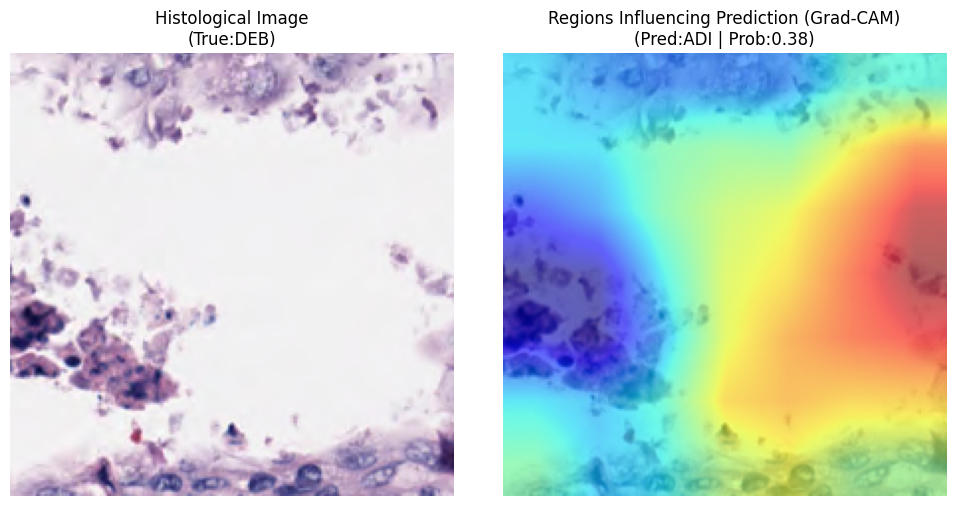

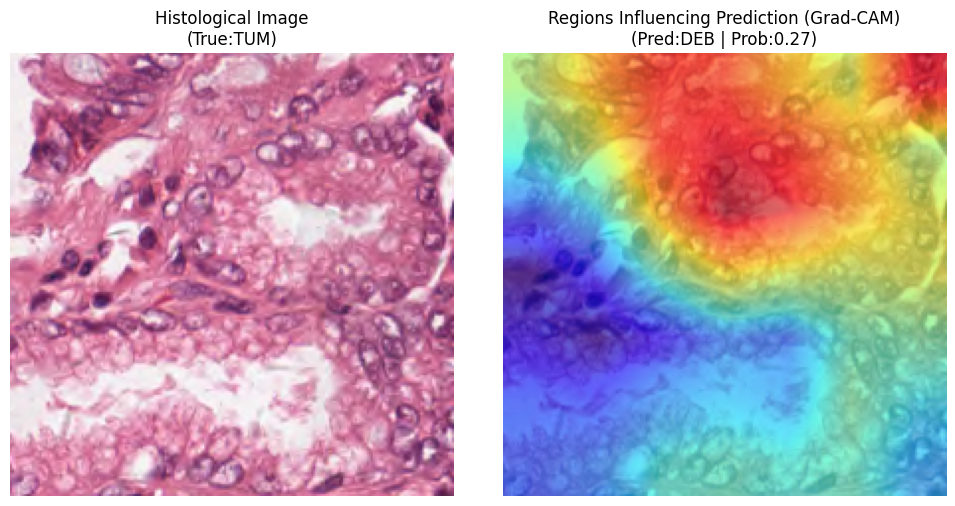

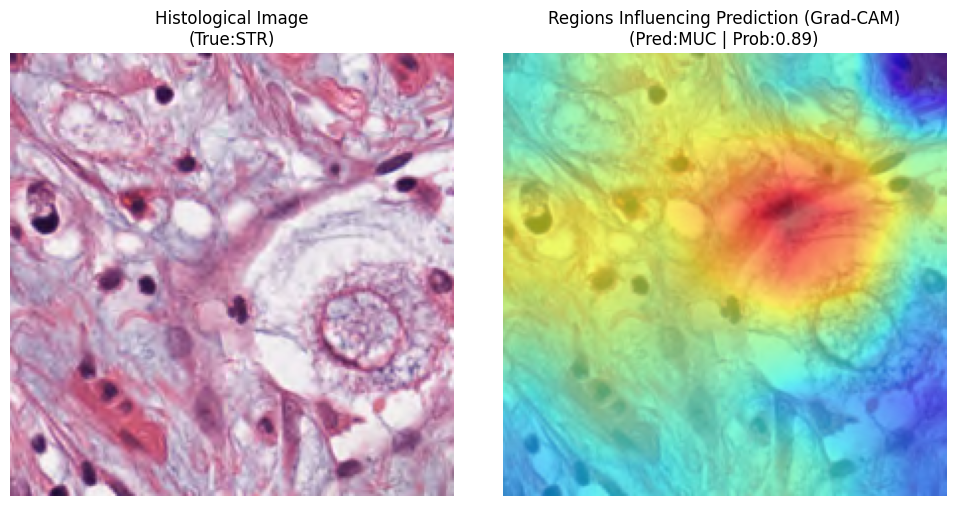

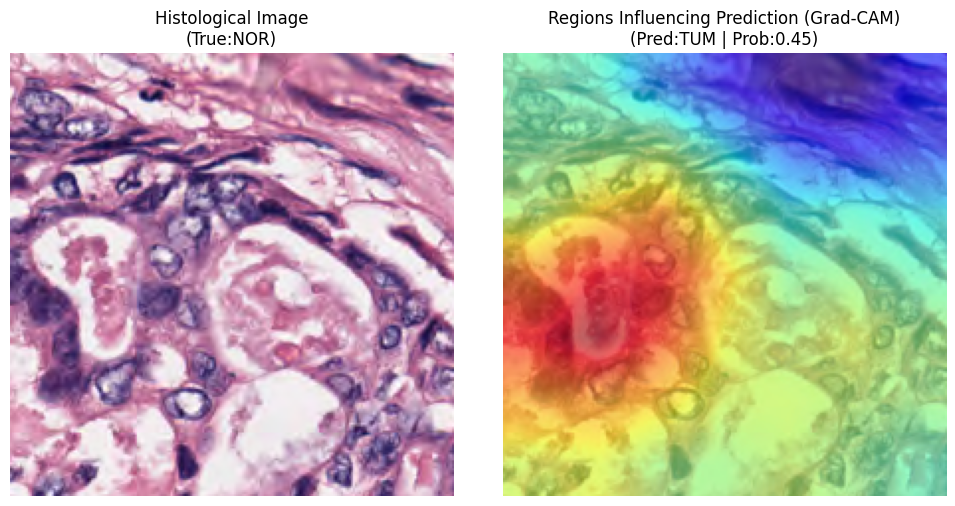

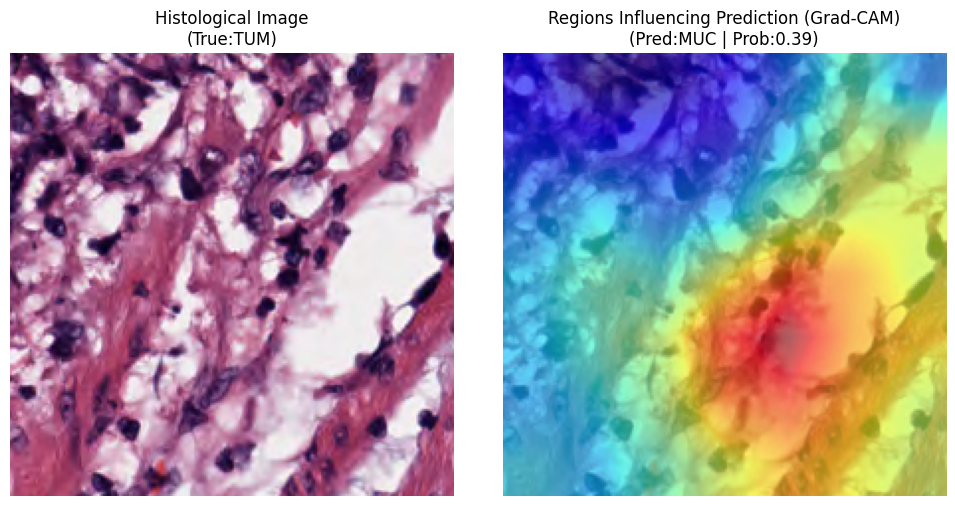

In [40]:
best_model = load_model("/kaggle/input/efficientnetb3-gastric-cancer-histopathology/tensorflow2/default/1/efficientnetb3_baseline.h5")
for i in range(500,505):
   image_path= misclassified_df['File'].iloc[i]
   result = histo_GradCAM(best_model,image_path)

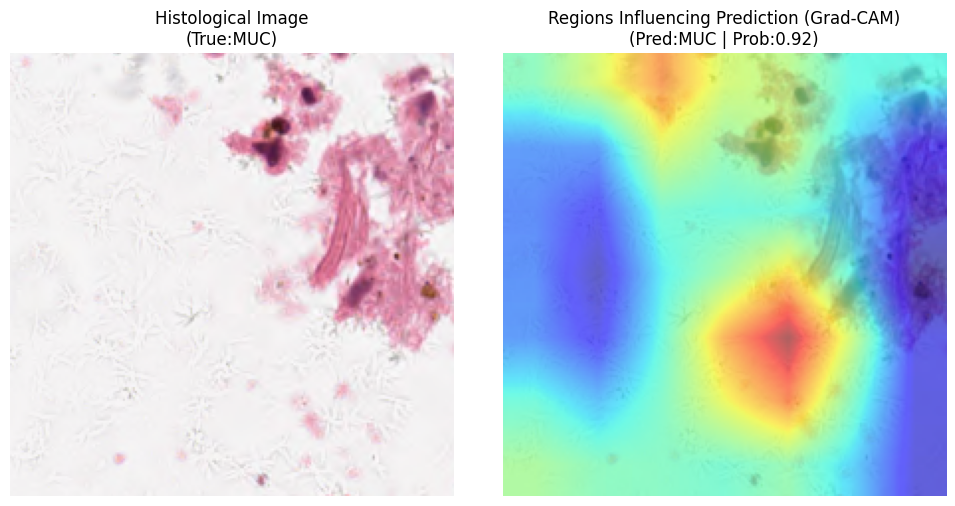

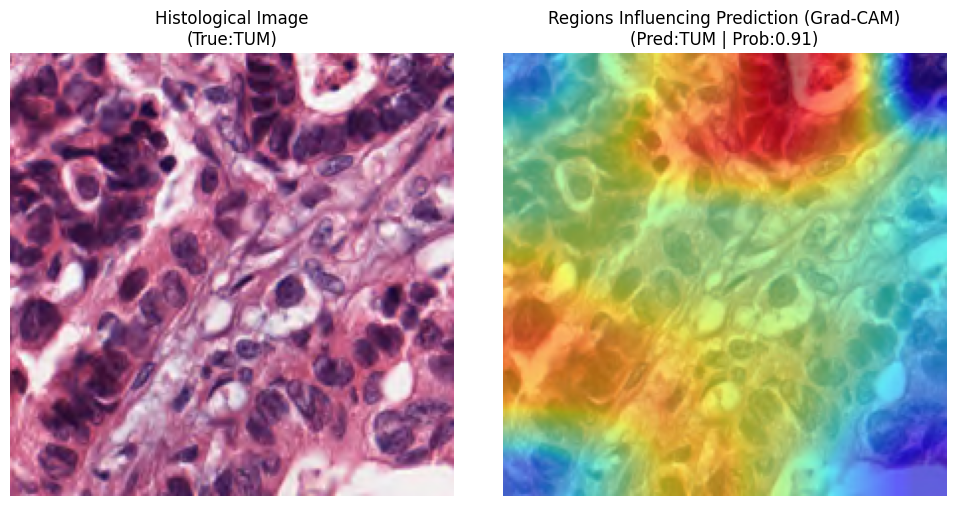

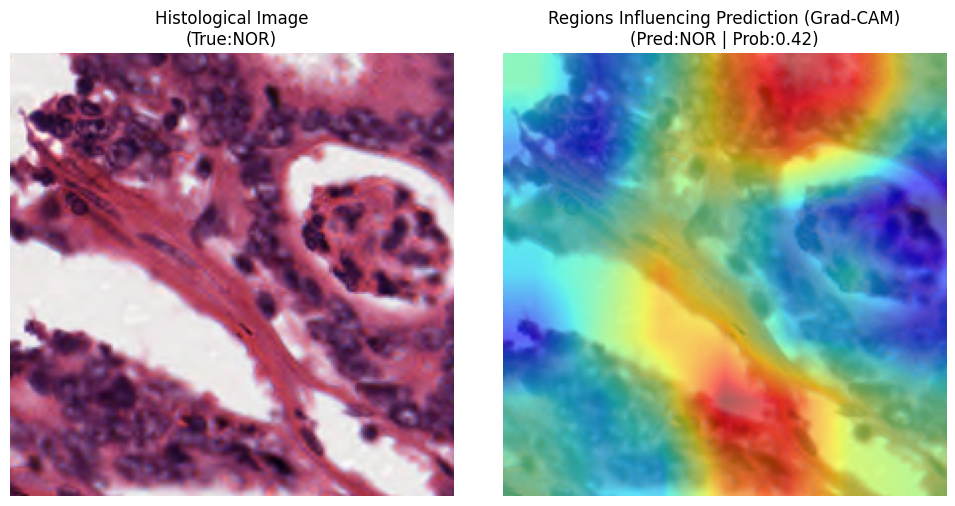

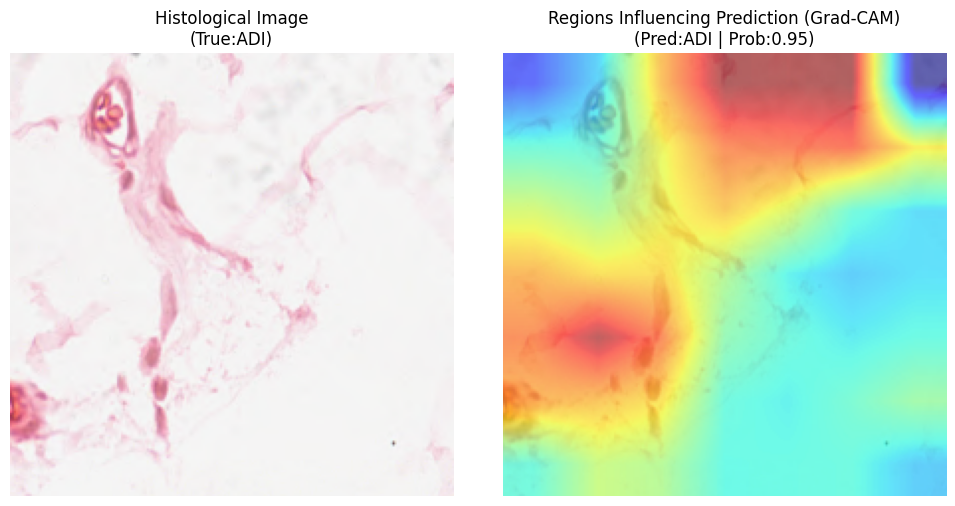

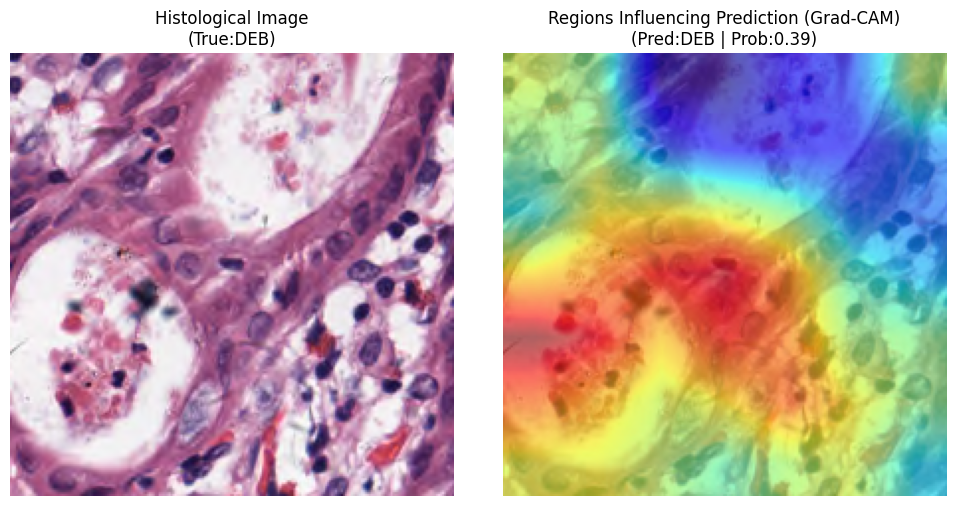

In [41]:
best_model = load_model("/kaggle/input/efficientnetb3-gastric-cancer-histopathology/tensorflow2/default/1/efficientnetb3_baseline.h5")
for i in range(500,505):
   image_path= corrclassified_df['File'].iloc[i]
   result = histo_GradCAM(best_model,image_path)

In [35]:

#Based on my model architecture I choose layers upto globalpooling layer.

feature_extractor= tf.keras.Model(inputs=best_model.input,outputs=best_model.layers[-2].output)
features= []
true_labels= [] 

tissue_label_numdict = {value:key for key, value in tissue_label_dict.items()}

for i in range(len(df)):
    image_path= df['File'].iloc[i]
    tissue_image= image.load_img(image_path)
    tissue_image_array= image.img_to_array(tissue_image)
    tissue_image_array= np.expand_dims(tissue_image_array,axis=0)
    
    dumm=feature_extractor.predict(tissue_image_array,verbose=0)
    features.append(dumm.flatten())
    true_labels.append(df['True Label'].iloc[i])  
    
numeric_labels= [tissue_label_numdict[label] for label in true_labels]
features= np.array(features)

In [71]:
X_2d= TSNE(n_components=2,random_state=42,perplexity=30).fit_transform(features)

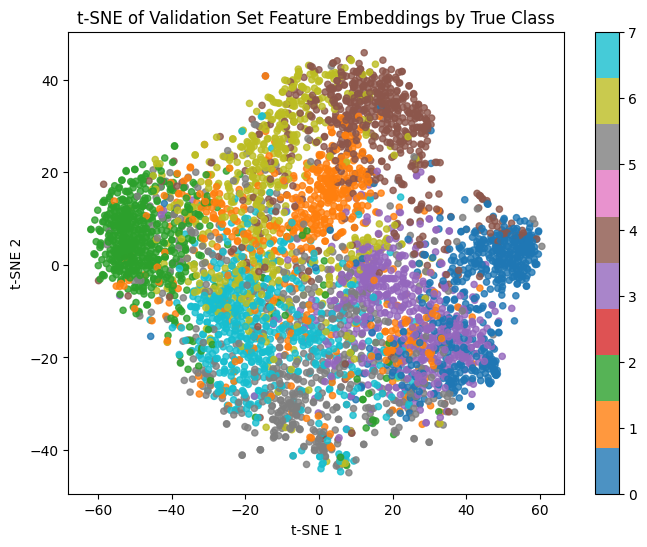

In [95]:
plt.figure(figsize=(8,6))
scatter = plt.scatter(X_2d[:,0],X_2d[:,1],c=numeric_labels,cmap='tab10',alpha=0.8,s=20)
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.title('t-SNE of Validation Set Feature Embeddings by True Class')
plt.colorbar(scatter)
plt.show()

In [11]:
validation_df= pd.read_csv("/kaggle/input/validation-predictions-updated/val_predictions_efficientnetb3_baseline.csv")

In [21]:
validation_df.head()

,File,True Label,Predicted Label,Prob_ADI,Prob_DEB,Prob_LYM,Prob_MUC,Prob_MUS,Prob_NOR,Prob_STR,Prob_TUM
0,/kaggle/input/gastric-cancer-histopathology-ti...,MUS,DEB,0.005212,0.605176,0.000926,0.006710,0.367359,0.002830,0.010666,0.001120
1,/kaggle/input/gastric-cancer-histopathology-ti...,DEB,DEB,0.002053,0.960201,0.002873,0.029853,0.003468,0.000832,0.000369,0.000351
2,/kaggle/input/gastric-cancer-histopathology-ti...,MUS,MUS,0.000746,0.006905,0.000341,0.004513,0.884466,0.000621,0.102127,0.000281
3,/kaggle/input/gastric-cancer-histopathology-ti...,DEB,DEB,0.001774,0.932781,0.000126,0.041211,0.000861,0.022964,0.000049,0.000234
4,/kaggle/input/gastric-cancer-histopathology-ti...,TUM,STR,0.001085,0.016126,0.033511,0.001114,0.140935,0.022847,0.538006,0.246375


In [25]:
len(validation_df)

4664

In [26]:
for tissue in tissue_types:
    dumm_df=validation_df[(validation_df['True Label']==tissue) & (validation_df['Predicted Label']==tissue)]
    true_dumm_df=validation_df[(validation_df['True Label']==tissue)]
    accuracy=len(dumm_df)/len(true_dumm_df)
    print(f"The accuracy for class {tissue} is {accuracy}")

The accuracy for class ADI is 0.8456014362657092
The accuracy for class DEB is 0.6638370118845501
The accuracy for class LYM is 0.8931698774080561
The accuracy for class MUC is 0.7443082311733801
The accuracy for class MUS is 0.7360655737704918
The accuracy for class NOR is 0.5938037865748709
The accuracy for class STR is 0.6678260869565218
The accuracy for class TUM is 0.6557377049180327


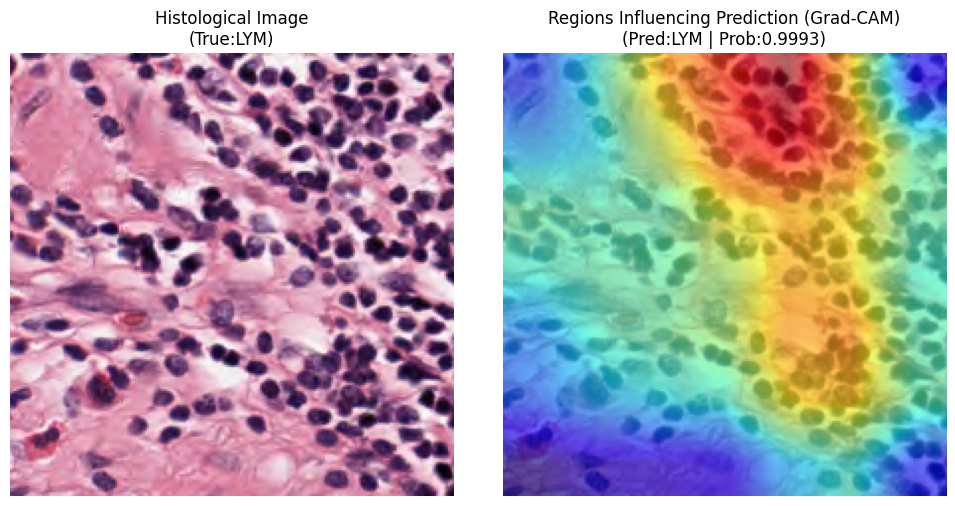

In [14]:
best_model = load_model("/kaggle/input/efficientnetb3-gastric-cancer-histopathology/tensorflow2/default/1/efficientnetb3_baseline.h5")
image_path="/kaggle/input/gastric-cancer-histopathology-tissue-image-dataset/HMU-GC-HE-30K/all_image/LYM/LYM_427.png"
result = histo_GradCAM(best_model,image_path)

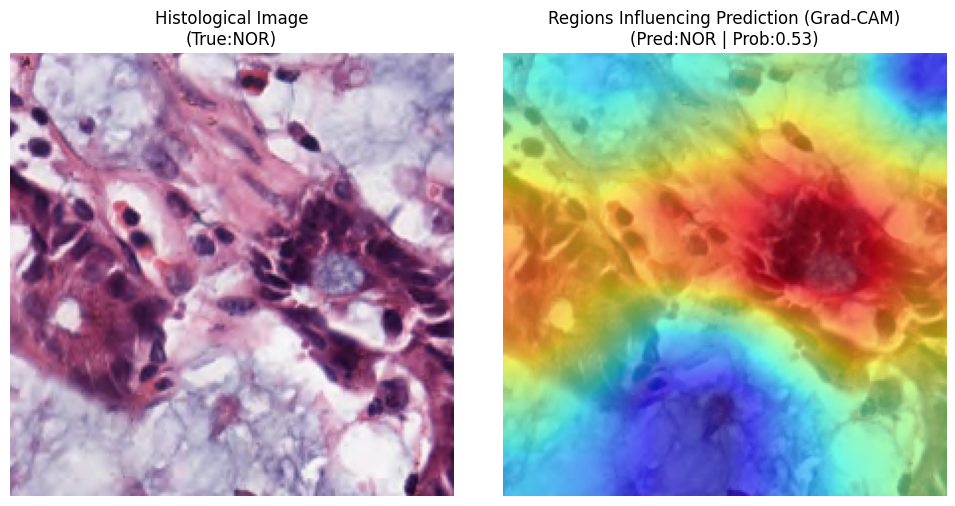

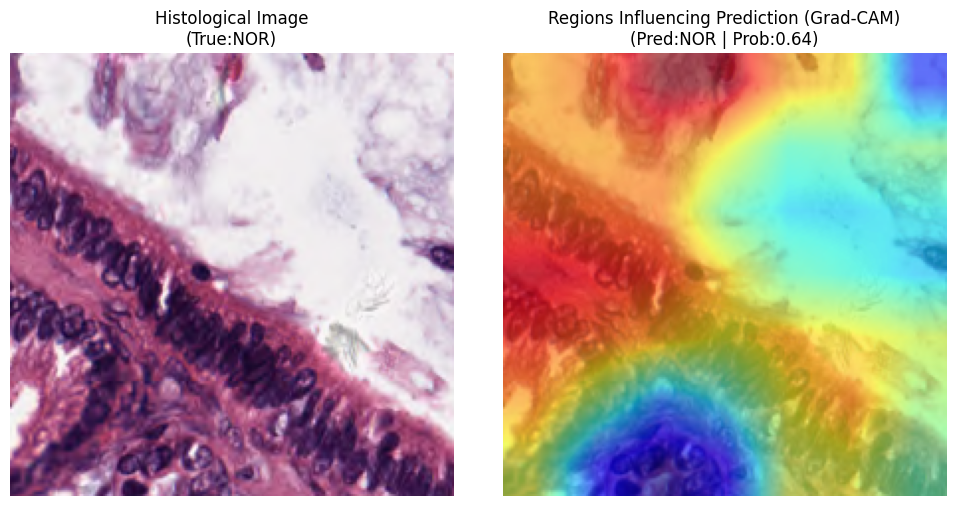

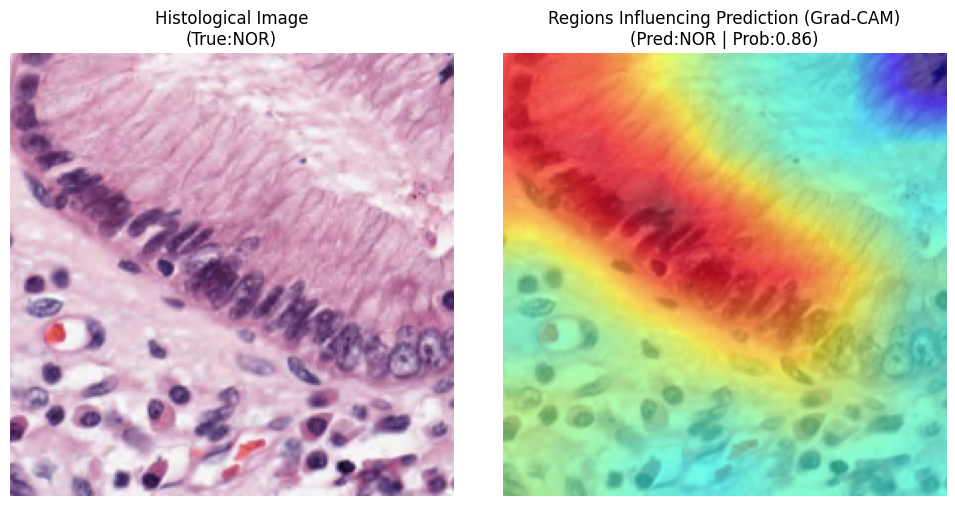

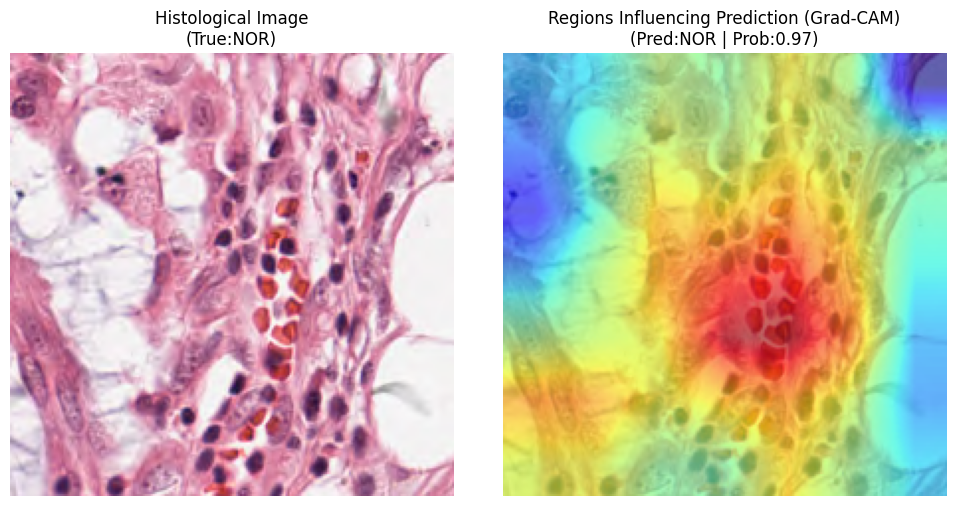

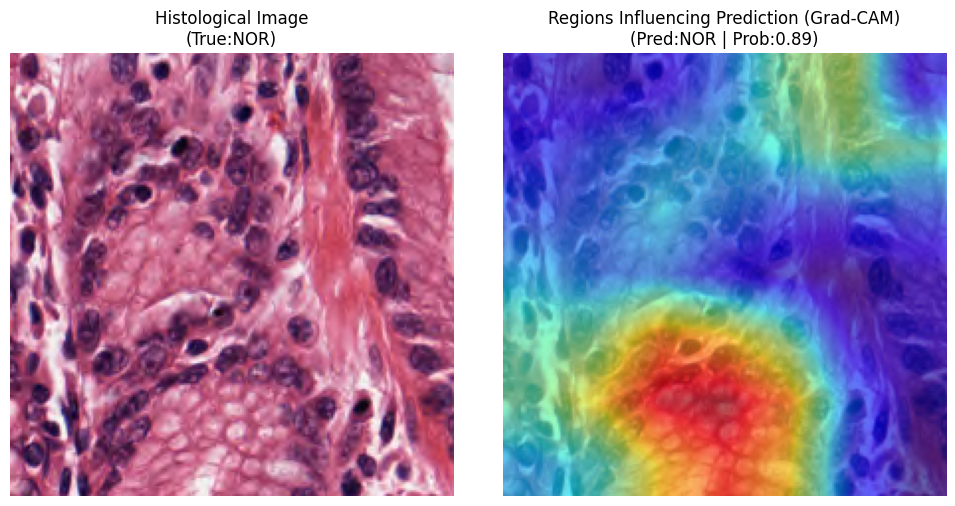

In [32]:
best_model = load_model("/kaggle/input/efficientnetb3-gastric-cancer-histopathology/tensorflow2/default/1/efficientnetb3_baseline.h5")
dumm_df=validation_df[(validation_df['True Label']=="NOR") & (validation_df['Predicted Label']=="NOR")]

# for i in range(5):
#    image_path= dumm_df['File'].iloc[i]
result = histo_GradCAM(best_model,image_path)

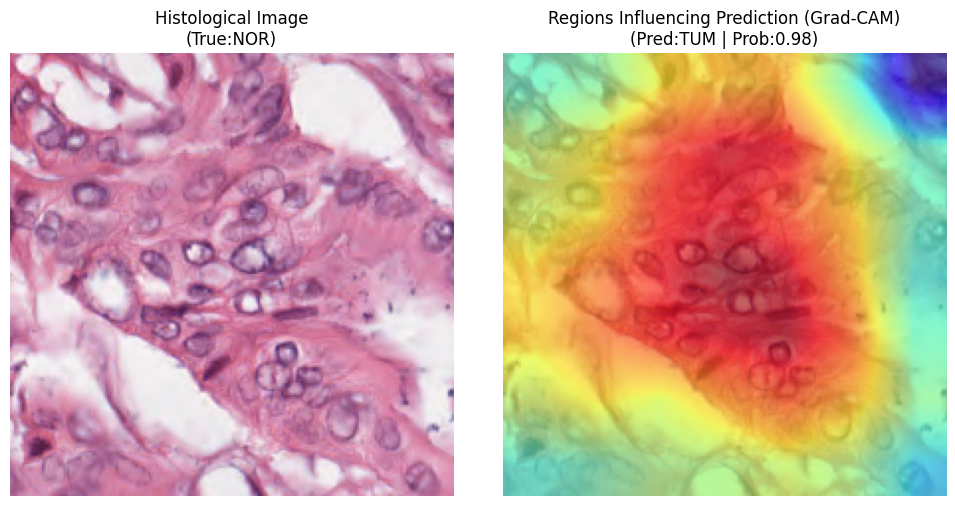

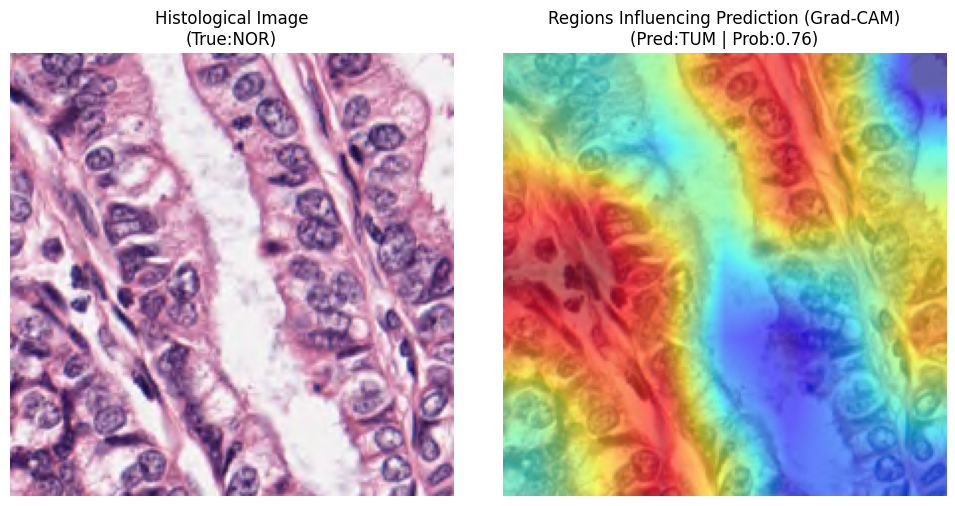

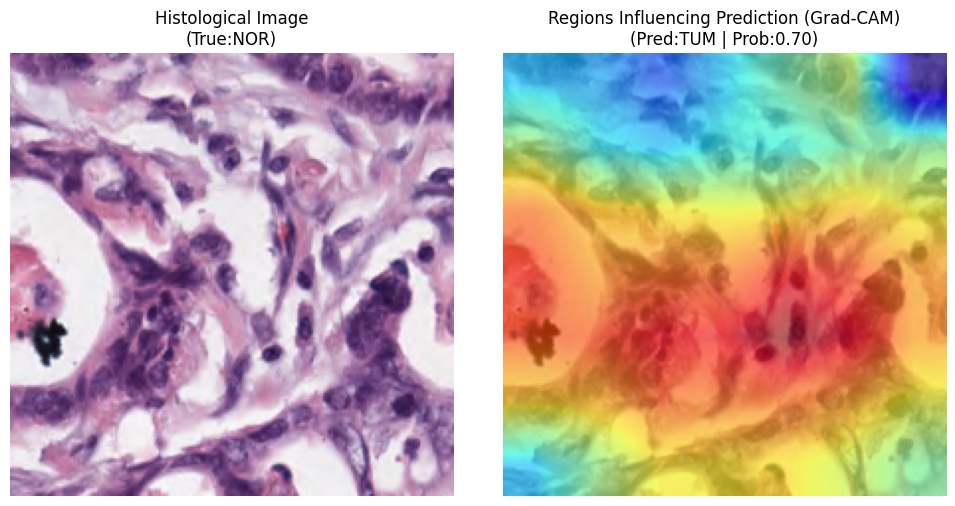

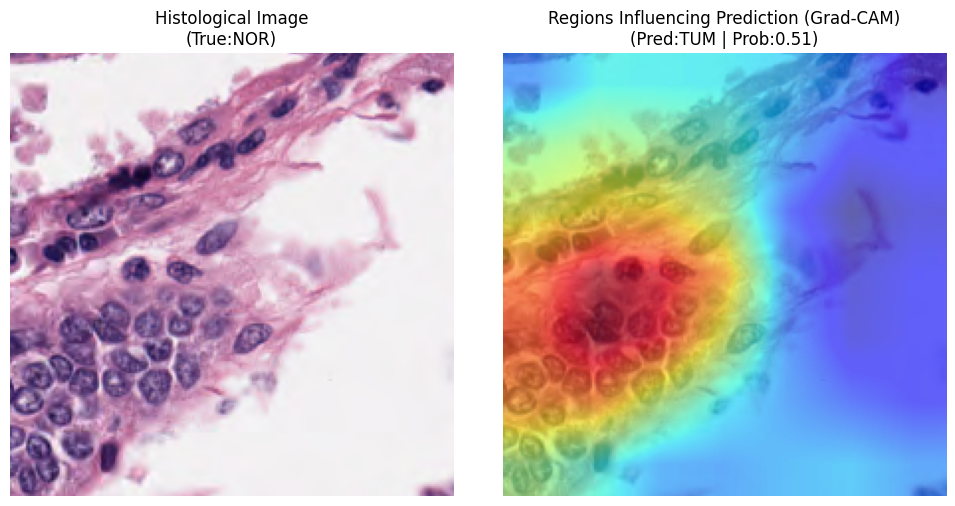

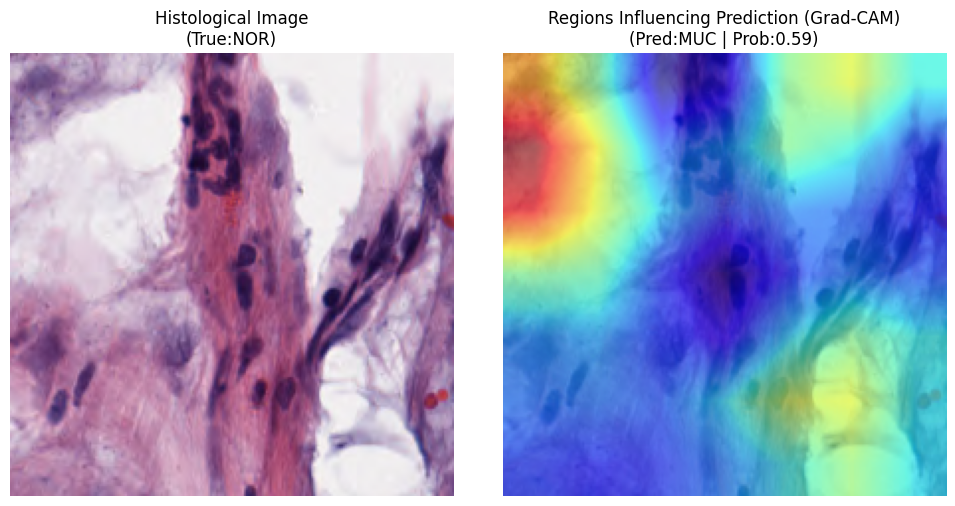

In [33]:
dumm_df=validation_df[(validation_df['True Label']=="NOR") & (validation_df['Predicted Label']!="NOR")]

for i in range(5):
   image_path= dumm_df['File'].iloc[i]
   result = histo_GradCAM(best_model,image_path)

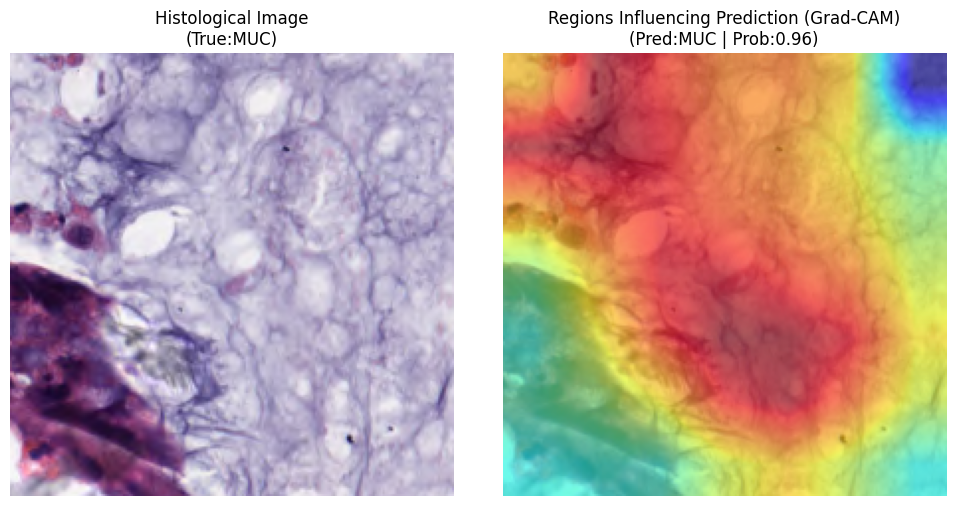

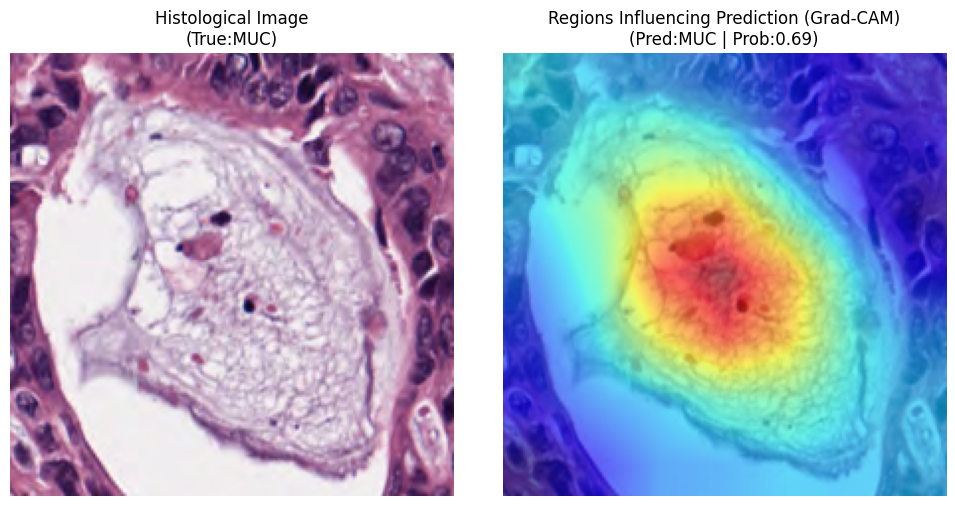

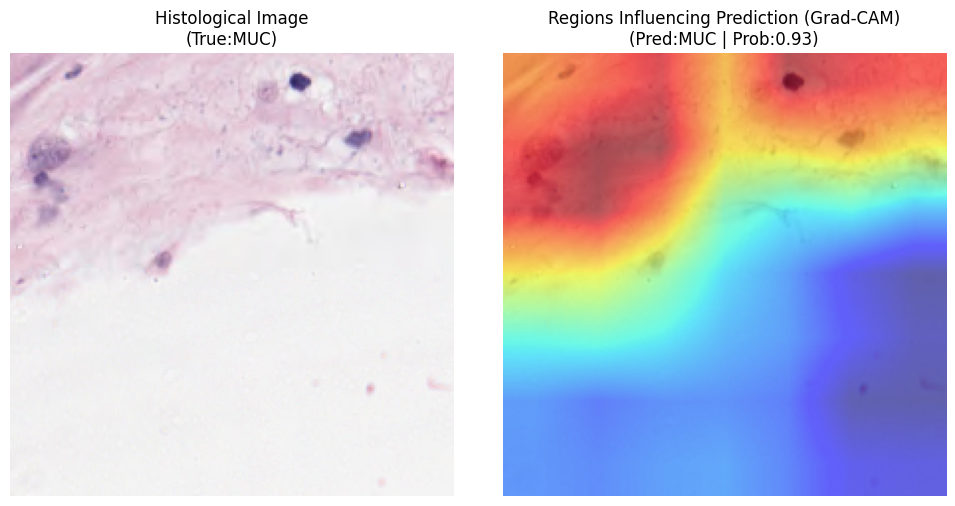

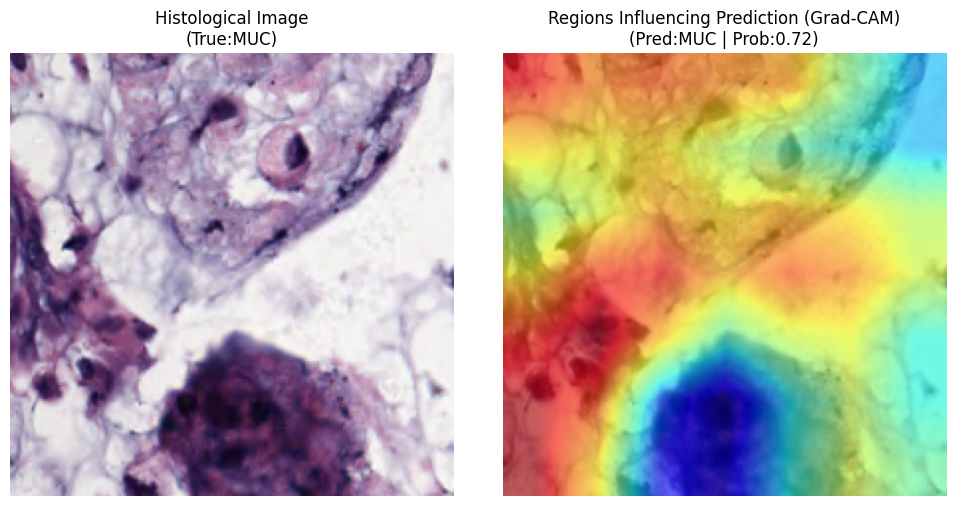

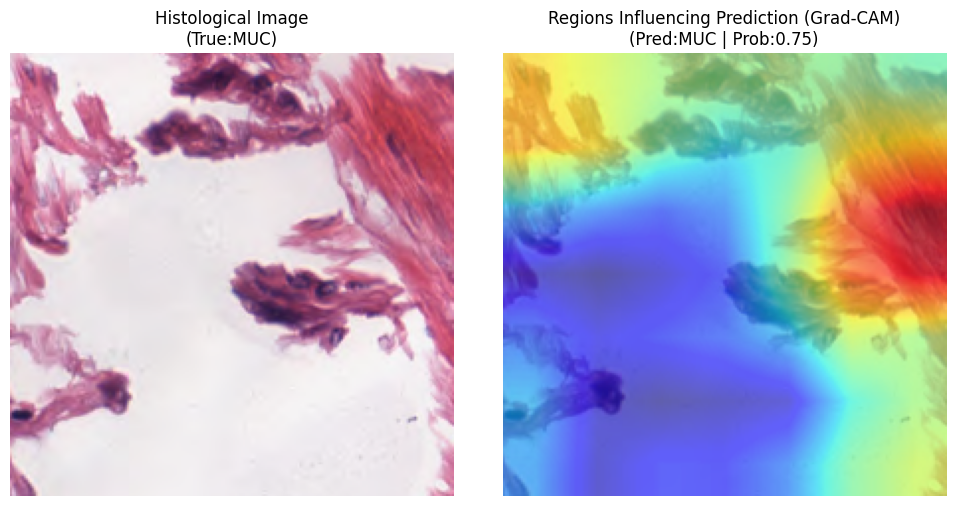

In [34]:
dumm_df=validation_df[(validation_df['True Label']=="MUC") & (validation_df['Predicted Label']=="MUC")]

for i in range(5):
   image_path= dumm_df['File'].iloc[i]
   result = histo_GradCAM(best_model,image_path)

In [1]:
import numpy as np
print(np.__version__)


1.26.4
